In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
import statsmodels.api as sm

In [ ]:
# data set used - link- https://www.kaggle.com/new-york-city/nyc-property-sales

# Source domain: CC0: Public Domain
#(Public)


data set used - link- https://www.kaggle.com/new-york-city/nyc-property-sales

Source domain: CC0: Public Domain


Last updated -- 2017-09-23

Date created -- 2017-09-23

Current version -- Version 1

In [2]:
df1= pd.read_csv('nyc-rolling-sales.csv')
print(df1.shape)

(84548, 22)


In [3]:
# Things to drop right away 
df1['SALE PRICE'] = pd.to_numeric(df1['SALE PRICE'], errors='coerce')

to_drop = ['EASE-MENT', 'Unnamed: 0', 'ADDRESS', 'APARTMENT NUMBER', 'COMMERCIAL UNITS']

dff= df1.copy()
dff.drop(to_drop, axis=1, inplace=True)

In [4]:
df1.columns

Index(['Unnamed: 0', 'BOROUGH', 'NEIGHBORHOOD', 'BUILDING CLASS CATEGORY',
       'TAX CLASS AT PRESENT', 'BLOCK', 'LOT', 'EASE-MENT',
       'BUILDING CLASS AT PRESENT', 'ADDRESS', 'APARTMENT NUMBER', 'ZIP CODE',
       'RESIDENTIAL UNITS', 'COMMERCIAL UNITS', 'TOTAL UNITS',
       'LAND SQUARE FEET', 'GROSS SQUARE FEET', 'YEAR BUILT',
       'TAX CLASS AT TIME OF SALE', 'BUILDING CLASS AT TIME OF SALE',
       'SALE PRICE', 'SALE DATE'],
      dtype='object')

In [5]:
dff.head()

,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,BUILDING CLASS AT PRESENT,ZIP CODE,RESIDENTIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE
0,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,392,6,C2,10009,5,5,1633,6440,1900,2,C2,6625000.0,2017-07-19 00:00:00
1,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,26,C7,10009,28,31,4616,18690,1900,2,C7,NaN,2016-12-14 00:00:00
2,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,39,C7,10009,16,17,2212,7803,1900,2,C7,NaN,2016-12-09 00:00:00
3,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2B,402,21,C4,10009,10,10,2272,6794,1913,2,C4,3936272.0,2016-09-23 00:00:00
4,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,404,55,C2,10009,6,6,2369,4615,1900,2,C2,8000000.0,2016-11-17 00:00:00


In [ ]:
dff.dtypes # 

BOROUGH                             int64
BUILDING CLASS CATEGORY            object
TAX CLASS AT PRESENT               object
BLOCK                               int64
LOT                                 int64
BUILDING CLASS AT PRESENT          object
ZIP CODE                            int64
RESIDENTIAL UNITS                   int64
TOTAL UNITS                         int64
LAND SQUARE FEET                  float64
GROSS SQUARE FEET                 float64
YEAR BUILT                          int64
TAX CLASS AT TIME OF SALE           int64
BUILDING CLASS AT TIME OF SALE     object
SALE PRICE                        float64
SALE DATE                          object
dtype: object

In [6]:
to_ch= ['LAND SQUARE FEET', 'GROSS SQUARE FEET', 'SALE PRICE']
for i in to_ch:
    dff[i] = pd.to_numeric(dff[i], errors='coerce')

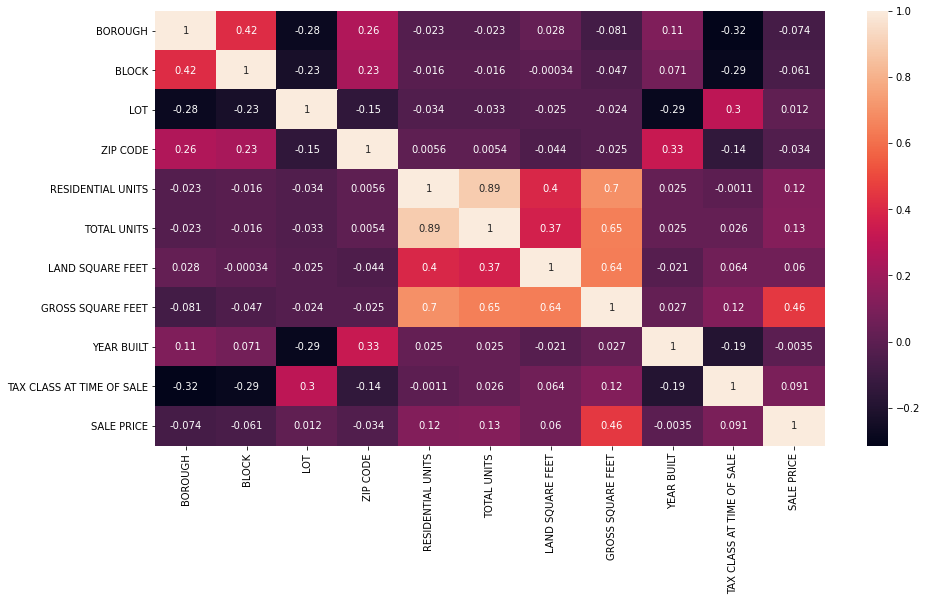

In [9]:
plt.figure(figsize=(15,8))
sns.heatmap(dff.corr(),annot=True)
plt.show()

In [12]:
dff.isnull().sum()

BOROUGH                               0
NEIGHBORHOOD                          0
BUILDING CLASS CATEGORY               0
TAX CLASS AT PRESENT                  0
BLOCK                                 0
LOT                                   0
BUILDING CLASS AT PRESENT             0
ZIP CODE                              0
RESIDENTIAL UNITS                     0
TOTAL UNITS                           0
LAND SQUARE FEET                  26252
GROSS SQUARE FEET                 27612
YEAR BUILT                            0
TAX CLASS AT TIME OF SALE             0
BUILDING CLASS AT TIME OF SALE        0
SALE PRICE                        14561
SALE DATE                             0
dtype: int64

## Sale price is only slightly correlated with Gross Square feet. 

## a little bit with the Tax class at time of sale- which makes sense

## Borough

In [ ]:
# No info on Unnamed.

# no data handling required for Borough.
df1['BOROUGH'].unique()

array([1, 2, 3, 4, 5])

In [ ]:
df1['BOROUGH'].isna().sum()

# no null values

0

In [ ]:
df1['BOROUGH'].dtype

dtype('int64')

## NEIGHBORHOOD

In [ ]:
df1['SALE PRICE'].groupby([df1['BOROUGH'], df1['NEIGHBORHOOD']]).mean()

# no null values

BOROUGH  NEIGHBORHOOD     
1        ALPHABET CITY        2.600241e+06
         CHELSEA              3.756297e+06
         CHINATOWN            2.964852e+06
         CIVIC CENTER         7.105168e+06
         CLINTON              1.876482e+06
                                  ...     
5        TRAVIS               8.844904e+05
         WEST NEW BRIGHTON    4.326212e+05
         WESTERLEIGH          5.187055e+05
         WILLOWBROOK          5.647710e+05
         WOODROW              6.673779e+05
Name: SALE PRICE, Length: 256, dtype: float64

## Null- The average prices of houses in both the neighborhood are same. 

## Alternate - The average prices of houses in both the neighborhood are NOT same.

In [ ]:
# Testing the difference of means
alph = pd.Series(dff.loc[dff['NEIGHBORHOOD']== 'TRAVIS']['SALE PRICE'])
alph.dropna(inplace=True)
alph

83491     445000.0
83492     480000.0
83493     470000.0
83494     412000.0
83495     465000.0
           ...    
83573    8250000.0
83575     600000.0
83588    2575625.0
83589    4000000.0
83594      10000.0
Name: SALE PRICE, Length: 71, dtype: float64

In [ ]:
shapiro(alph)

(0.3189650774002075, 1.739371436925967e-16)

In [ ]:
# CHELSEA

chel = pd.Series(dff.loc[dff['NEIGHBORHOOD']== 'WEST NEW BRIGHTON']['SALE PRICE'])
chel.dropna(inplace=True)
chel


83599     415000.0
83600     631800.0
83601     499999.0
83602     585000.0
83603     585000.0
           ...    
83903      45000.0
83905     175000.0
83907     395000.0
83909     386820.0
83911    2500000.0
Name: SALE PRICE, Length: 234, dtype: float64

In [ ]:
chel2= chel.sample(71)

In [ ]:
import scipy.stats as stats
stats.mannwhitneyu(alph, chel2)

MannwhitneyuResult(statistic=2354.0, pvalue=0.24910223024351613)

### Since p value is more than 0.05, we fail to reject the null hypothesis

In [ ]:
dff.drop({'NEIGHBORHOOD'}, axis=1, inplace=True)

In [ ]:
dff.head()

In [ ]:
dff.shape

(84548, 16)

## BUILDING CLASS CATEGORY

In [ ]:
len(df1['BUILDING CLASS CATEGORY'][0])

43

In [ ]:
# All have spaces. 
# all have numbers

dff['BUILDING CLASS CATEGORY'] = [i.strip() for i in dff['BUILDING CLASS CATEGORY']]

In [ ]:
dff['BCC'] = [i[2:] for i in dff['BUILDING CLASS CATEGORY']]
dff.drop({'BUILDING CLASS CATEGORY'}, axis=1, inplace=True)
dff.head()

,BOROUGH,TAX CLASS AT PRESENT,BLOCK,LOT,BUILDING CLASS AT PRESENT,ZIP CODE,RESIDENTIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE,BCC
0,1,2A,392,6,C2,10009,5,5,1633.0,6440.0,1900,2,C2,6625000.0,2017-07-19 00:00:00,RENTALS - WALKUP APARTMENTS
1,1,2,399,26,C7,10009,28,31,4616.0,18690.0,1900,2,C7,NaN,2016-12-14 00:00:00,RENTALS - WALKUP APARTMENTS
2,1,2,399,39,C7,10009,16,17,2212.0,7803.0,1900,2,C7,NaN,2016-12-09 00:00:00,RENTALS - WALKUP APARTMENTS
3,1,2B,402,21,C4,10009,10,10,2272.0,6794.0,1913,2,C4,3936272.0,2016-09-23 00:00:00,RENTALS - WALKUP APARTMENTS
4,1,2A,404,55,C2,10009,6,6,2369.0,4615.0,1900,2,C2,8000000.0,2016-11-17 00:00:00,RENTALS - WALKUP APARTMENTS


In [ ]:
dff['BCC'].isna().sum()

0

In [ ]:
# just for condos only, we have these many types of sub-divisions, lets do a Manova test and find whether they have significant differences or not 

# Condos-  CONDO CULTURAL/MEDICAL/EDUCATIONAL/ETC ### CONDO STORE BUILDINGS ### CONDO WAREHOUSES/FACTORY/INDUS ### CONDO OFFICE BUILDINGS 
### CONDO TERRACES/GARDENS/CABANAS ### CONDOS - 2-10 UNIT WITH COMMERCIAL UNIT

# do a Manova and merge them. (Check for the parametric- Shapiro, Levene, test of independence- )

In [ ]:
rtr= ['43 CONDO OFFICE BUILDINGS', '44 CONDO PARKING', '45 CONDO HOTELS', '46 CONDO STORE BUILDINGS', '47 CONDO NON-BUSINESS STORAGE', '48 CONDO TERRACES/GARDENS/CABANAS', '49 CONDO WAREHOUSES/FACTORY/INDUS']

fty = {}

for i in rtr:
  fty[i] = pd.Series(dff.loc[(dff['BCC']== i) & (dff['SALE PRICE'] > 0)]['SALE PRICE'])

In [ ]:
# Checking Normality:
from scipy.stats import shapiro

for i in fty.keys():
  print(shapiro(fty[i]))


(0.16323506832122803, 1.1040887113827175e-31)
(0.1415768265724182, 4.733299735963756e-34)
(0.17221683263778687, 9.530680021312512e-20)
(0.51365065574646, 1.4637125739973625e-14)
(0.48215603828430176, 2.0268907198798224e-14)
(0.5346704721450806, 3.220696817152202e-05)
(0.9766690731048584, 0.9448862671852112)


In [ ]:
# None of the features are normal. so we can do a kruskal test (Non parametric alternate for Anova)

### Null- The average prices are same - belonging to each sub catrgory of Condos category

### Alternate- they are not same. 

In [ ]:
from scipy.stats import kruskal
kruskal(fty['43 CONDO OFFICE BUILDINGS'], fty['44 CONDO PARKING'], fty['45 CONDO HOTELS'], fty['46 CONDO STORE BUILDINGS'], fty['47 CONDO NON-BUSINESS STORAGE'], fty['48 CONDO TERRACES/GARDENS/CABANAS'], fty['49 CONDO WAREHOUSES/FACTORY/INDUS'])

KruskalResult(statistic=425.797577219505, pvalue=7.918210616216694e-89)

In [ ]:
# we can reject the null. they are indeed different. so we CAN NOT subdivide each of them

In [ ]:
# probably find shorted names/ or create a hierarchy and then subdivide it based on cols

[i[3:] for i in df1['BUILDING CLASS CATEGORY']][:5]

['RENTALS - WALKUP APARTMENTS',
 'RENTALS - WALKUP APARTMENTS',
 'RENTALS - WALKUP APARTMENTS',
 'RENTALS - WALKUP APARTMENTS',
 'RENTALS - WALKUP APARTMENTS']

In [ ]:
df1['BUILDING CLASS CATEGORY'].unique()

array(['07 RENTALS - WALKUP APARTMENTS',
       '08 RENTALS - ELEVATOR APARTMENTS', '09 COOPS - WALKUP APARTMENTS',
       '10 COOPS - ELEVATOR APARTMENTS', '11A CONDO-RENTALS',
       '12 CONDOS - WALKUP APARTMENTS', '13 CONDOS - ELEVATOR APARTMENTS',
       '14 RENTALS - 4-10 UNIT', '15 CONDOS - 2-10 UNIT RESIDENTIAL',
       '16 CONDOS - 2-10 UNIT WITH COMMERCIAL UNIT', '17 CONDO COOPS',
       '22 STORE BUILDINGS', '37 RELIGIOUS FACILITIES',
       '42 CONDO CULTURAL/MEDICAL/EDUCATIONAL/ETC',
       '46 CONDO STORE BUILDINGS', '47 CONDO NON-BUSINESS STORAGE',
       '01 ONE FAMILY DWELLINGS', '02 TWO FAMILY DWELLINGS',
       '03 THREE FAMILY DWELLINGS', '04 TAX CLASS 1 CONDOS',
       '21 OFFICE BUILDINGS', '23 LOFT BUILDINGS', '25 LUXURY HOTELS',
       '26 OTHER HOTELS', '28 COMMERCIAL CONDOS', '29 COMMERCIAL GARAGES',
       '35 INDOOR PUBLIC AND CULTURAL FACILITIES', '38 ASYLUMS AND HOMES',
       '43 CONDO OFFICE BUILDINGS', '44 CONDO PARKING',
       '48 CONDO TERRACES/GARDE

In [ ]:
df1['SALE PRICE'].groupby(df1['BUILDING CLASS CATEGORY']).mean()

## TAX CLASS AT PRESENT

In [ ]:
dff['TAX CLASS AT PRESENT'].unique()

array(['2A', '2', '2B', '2C', ' ', '4', '1', '1C', '3', '1A', '1B'],
      dtype=object)

In [ ]:
dff['TAX CLASS AT PRESENT'].replace({' ': np.nan}, inplace=True)

In [ ]:
dff.loc[df1['TAX CLASS AT PRESENT']== ' ']

,BOROUGH,TAX CLASS AT PRESENT,BLOCK,LOT,BUILDING CLASS AT PRESENT,ZIP CODE,RESIDENTIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE,BCC
74,1,NaN,394,1602,,0,0,0,NaN,NaN,0,2,RR,8058923.0,2017-08-09 00:00:00,A CONDO-RENTALS
198,1,NaN,394,1601,,0,0,0,NaN,NaN,0,4,RA,NaN,2017-08-09 00:00:00,CONDO CULTURAL/MEDICAL/EDUCATIONAL/ETC
573,1,NaN,699,1306,,10001,0,0,NaN,NaN,0,2,R4,7165843.0,2017-08-09 00:00:00,CONDOS - ELEVATOR APARTMENTS
574,1,NaN,699,1309,,10001,0,0,NaN,NaN,0,2,R4,4937073.0,2017-08-02 00:00:00,CONDOS - ELEVATOR APARTMENTS
575,1,NaN,699,1311,,0,0,0,NaN,NaN,0,2,R4,6033271.0,2017-06-27 00:00:00,CONDOS - ELEVATOR APARTMENTS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66425,4,NaN,268,1050,,11101,0,0,NaN,NaN,0,2,R4,809508.0,2017-08-30 00:00:00,CONDOS - ELEVATOR APARTMENTS
66426,4,NaN,268,1057,,11101,0,0,NaN,NaN,0,2,R4,911333.0,2017-08-23 00:00:00,CONDOS - ELEVATOR APARTMENTS
66690,4,NaN,268,1151,,11101,0,0,NaN,NaN,0,4,RS,20080.0,2017-08-25 00:00:00,CONDO NON-BUSINESS STORAGE
73889,4,NaN,12529,220,,0,0,0,NaN,NaN,0,1,V0,3500000.0,2017-07-27 00:00:00,TAX CLASS 1 VACANT LAND


In [ ]:
dff['TAX CLASS AT PRESENT'].isna().sum()

0

In [ ]:
pd.crosstab(dff['TAX CLASS AT PRESENT'], dff['TAX CLASS AT TIME OF SALE'])

TAX CLASS AT TIME OF SALE,1,2,3,4
TAX CLASS AT PRESENT,,,,
1,38624,5,0,4
1A,1444,0,0,0
1B,1233,0,0,1
1C,186,0,0,0
2,2,30911,0,6
2A,4,2517,0,0
2B,4,808,0,2
2C,0,1909,0,6
3,0,0,4,0


In [ ]:
for i in range(len(dff['TAX CLASS AT PRESENT'])):
  if isinstance(dff['TAX CLASS AT PRESENT'][i], float):
    dff['TAX CLASS AT PRESENT'][i] = dff['TAX CLASS AT TIME OF SALE']

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
dff.head()

## BLOCK

In [ ]:
dff['BLOCK'].unique()

array([ 392,  399,  402, ..., 6918, 7074, 7092])

In [ ]:
dff['BLOCK'].isna().sum()

0

In [ ]:
dff['BLOCK'].dtypes

dtype('int64')

## LOT

In [ ]:
dff['LOT'].unique()

array([  6,  26,  39, ..., 655, 423, 679])

In [ ]:
dff['LOT'].dtypes

dtype('int64')

In [ ]:
dff['BLOCK'].isna().sum()

0

## BUILDING CLASS AT PRESENT

In [ ]:
dff['BUILDING CLASS AT PRESENT'].unique()

array(['C2', 'C7', 'C4', 'D5', 'D9', 'D7', 'D1', 'C6', 'D0', 'D4', 'RR',
       ' ', 'R2', 'R4', 'S3', 'S4', 'S5', 'R1', 'R8', 'R9', 'K4', 'M9',
       'M3', 'RK', 'RS', 'A9', 'A4', 'B3', 'B1', 'S2', 'C0', 'R6', 'C5',
       'C3', 'C1', 'D6', 'S9', 'O2', 'O1', 'O3', 'O5', 'O6', 'K1', 'K2',
       'L9', 'L8', 'L1', 'H1', 'H8', 'H3', 'R5', 'G6', 'P7', 'M1', 'N2',
       'RB', 'RG', 'RT', 'K9', 'V1', 'GW', 'G2', 'I7', 'M4', 'Z9', 'B9',
       'D3', 'G9', 'I9', 'U6', 'O4', 'L3', 'H2', 'E1', 'Z3', 'RW', 'C9',
       'J5', 'N9', 'S1', 'A5', 'J8', 'B2', 'C8', 'F5', 'Q1', 'G7', 'G5',
       'G4', 'P2', 'Q9', 'Y1', 'RA', 'RP', 'O8', 'HR', 'G1', 'E7', 'I5',
       'R3', 'I4', 'H9', 'RH', 'D8', 'HB', 'J4', 'W2', 'P9', 'A7', 'D2',
       'S0', 'O7', 'O9', 'W3', 'HS', 'H6', 'J9', 'R0', 'HH', 'W8', 'W6',
       'A1', 'K5', 'F1', 'V9', 'A2', 'V0', 'G0', 'F4', 'E9', 'I3', 'W4',
       'V3', 'I1', 'A6', 'Q8', 'A3', 'Z0', 'W1', 'U1', 'F2', 'F9', 'GU',
       'I6', 'G8', 'P5', 'Y3', 'W9', 'M2', 'G3', 'V6

In [ ]:
dff['BUILDING CLASS AT PRESENT'].isna().sum()

738

In [ ]:
dff['BUILDING CLASS AT PRESENT'].replace({' ': np.nan}, inplace=True)

In [ ]:
dff.head()

,BOROUGH,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,BUILDING CLASS AT PRESENT,ZIP CODE,RESIDENTIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE
0,1,07 RENTALS - WALKUP APARTMENTS,2A,392,6,C2,10009,5,5,1633,6440,1900,2,C2,6625000.0,2017-07-19 00:00:00
1,1,07 RENTALS - WALKUP APARTMENTS,2,399,26,C7,10009,28,31,4616,18690,1900,2,C7,NaN,2016-12-14 00:00:00
2,1,07 RENTALS - WALKUP APARTMENTS,2,399,39,C7,10009,16,17,2212,7803,1900,2,C7,NaN,2016-12-09 00:00:00
3,1,07 RENTALS - WALKUP APARTMENTS,2B,402,21,C4,10009,10,10,2272,6794,1913,2,C4,3936272.0,2016-09-23 00:00:00
4,1,07 RENTALS - WALKUP APARTMENTS,2A,404,55,C2,10009,6,6,2369,4615,1900,2,C2,8000000.0,2016-11-17 00:00:00


In [ ]:
dff['BUILDING CLASS AT TIME OF SALE'].unique()

array(['C2', 'C7', 'C4', 'D5', 'D9', 'D7', 'D1', 'C6', 'D0', 'D4', 'RR',
       'R2', 'R4', 'S3', 'S4', 'S5', 'R1', 'R8', 'R9', 'K4', 'M9', 'M3',
       'RA', 'RK', 'RS', 'A9', 'A4', 'B3', 'B1', 'S2', 'C0', 'R6', 'C5',
       'C3', 'C1', 'D6', 'S9', 'O2', 'O1', 'O3', 'O5', 'O6', 'K1', 'K2',
       'L9', 'L8', 'L1', 'H1', 'H8', 'H3', 'R5', 'G9', 'G6', 'P7', 'M1',
       'N2', 'RB', 'RG', 'RT', 'K9', 'V1', 'GW', 'G2', 'I7', 'M4', 'Z9',
       'B9', 'D3', 'I9', 'U6', 'O4', 'L3', 'H2', 'E1', 'Z3', 'Q1', 'RW',
       'C9', 'J5', 'N9', 'S1', 'A5', 'J8', 'B2', 'C8', 'F5', 'G7', 'G5',
       'G4', 'P2', 'Q9', 'Y1', 'RP', 'O8', 'HR', 'G1', 'E7', 'I5', 'R3',
       'I4', 'H9', 'RH', 'D8', 'HB', 'J4', 'W2', 'P9', 'A7', 'D2', 'S0',
       'O7', 'O9', 'W3', 'HS', 'H6', 'J9', 'R0', 'HH', 'W8', 'W6', 'A1',
       'K5', 'F1', 'V9', 'A2', 'V0', 'G0', 'F4', 'E9', 'I3', 'W4', 'V3',
       'I1', 'A6', 'Q8', 'A3', 'Z0', 'W1', 'U1', 'F2', 'F9', 'GU', 'I6',
       'G8', 'P5', 'Y3', 'W9', 'M2', 'G3', 'V6', 'K

In [ ]:
dff['BUILDING CLASS AT TIME OF SALE'].isna().sum()

0

In [ ]:
pd.crosstab(dff['BUILDING CLASS AT PRESENT'], dff['BUILDING CLASS AT TIME OF SALE'])

BUILDING CLASS AT TIME OF SALE,A0,A1,A2,A3,A4,A5,A6,A7,A9,B1,B2,B3,B9,C0,C1,C2,C3,C4,C5,C6,C7,C8,C9,CM,D0,D1,D2,D3,D4,D5,D6,D7,D8,D9,E1,E2,E7,E9,F1,F2,...,RA,RB,RG,RH,RK,RP,RR,RS,RT,RW,S0,S1,S2,S3,S4,S5,S9,T2,U1,U6,V0,V1,V2,V3,V6,V9,W1,W2,W3,W4,W6,W8,W9,Y1,Y3,Z0,Z2,Z3,Z7,Z9
BUILDING CLASS AT PRESENT,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,0,0,0,0,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,...,1,9,71,0,2,24,1,26,0,0,0,0,0,0,0,0,0,0,0,0,1,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
A0,429,0,38,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
A1,0,6740,0,2,0,0,0,0,2,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
A2,0,1,2819,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
A3,0,2,0,386,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Z0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,14,0,0,0,0
Z2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0
Z3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0


In [ ]:
pd.crosstab(dff['BUILDING CLASS AT PRESENT'], dff['BUILDING CLASS AT TIME OF SALE'])[pd.crosstab(dff['BUILDING CLASS AT PRESENT'], dff['BUILDING CLASS AT TIME OF SALE']).index[115:]][115:130]

BUILDING CLASS AT TIME OF SALE,Q8,Q9,R0,R1,R2,R3,R4,R5,R6,R7,R8,R9,RA,RB,RG,RH,RK,RP,RR,RS,RT,RW,S0,S1,S2,S3,S4,S5,S9,T2,U1,U6,V0,V1,V2,V3,V6,V9,W1,W2,W3,W4,W6,W8,W9,Y1,Y3,Z0,Z2,Z3,Z7,Z9
BUILDING CLASS AT PRESENT,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Q8,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Q9,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
R0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
R1,0,0,0,1223,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
R2,0,0,0,0,926,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
R3,0,0,0,0,0,1444,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
R4,0,0,0,0,0,0,12477,0,0,0,0,0,0,0,3,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
R5,0,0,0,0,0,0,0,20,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
R6,0,0,0,0,0,0,0,0,185,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
dff[dff['BUILDING CLASS AT PRESENT'].isna()]

,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,BUILDING CLASS AT PRESENT,ZIP CODE,RESIDENTIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE


In [ ]:
# we can drop BUILDING CLASS AT PRESENT

In [ ]:
dff.drop({'BUILDING CLASS AT PRESENT'}, axis=1, inplace=True)

## LAND SQUARE FEET

In [ ]:
dff.shape

(84548, 15)

In [ ]:
dff.isna().sum()

BOROUGH                               0
TAX CLASS AT PRESENT                  0
BLOCK                                 0
LOT                                   0
ZIP CODE                              0
RESIDENTIAL UNITS                     0
TOTAL UNITS                           0
LAND SQUARE FEET                  26252
GROSS SQUARE FEET                 27612
YEAR BUILT                            0
TAX CLASS AT TIME OF SALE             0
BUILDING CLASS AT TIME OF SALE        0
SALE PRICE                        14561
SALE DATE                             0
BCC                                   0
dtype: int64

In [ ]:
dff.corr()['LAND SQUARE FEET'].sort_values(ascending= False)

LAND SQUARE FEET             1.000000
GROSS SQUARE FEET            0.642950
RESIDENTIAL UNITS            0.397929
TOTAL UNITS                  0.368495
TAX CLASS AT TIME OF SALE    0.064364
SALE PRICE                   0.060183
BOROUGH                      0.028294
BLOCK                       -0.000338
YEAR BUILT                  -0.021124
LOT                         -0.024593
ZIP CODE                    -0.044467
Name: LAND SQUARE FEET, dtype: float64

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


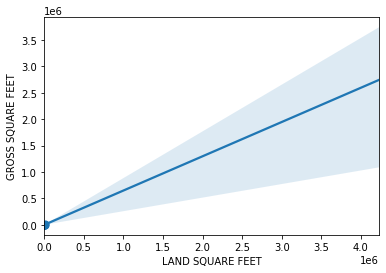

In [ ]:
sns.regplot(dff['LAND SQUARE FEET'], dff['GROSS SQUARE FEET'], ci=99, x_bins=10, n_boot=5000)

In [ ]:
dff['LAND SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()

RESIDENTIAL UNITS
0       7.855944e+03
1       2.600266e+03
2       2.864908e+03
3       2.490661e+03
4       2.558526e+03
            ...     
889     2.457300e+04
894     1.418360e+05
948     6.790000e+05
1641    3.579350e+05
1844    4.228300e+06
Name: LAND SQUARE FEET, Length: 176, dtype: float64

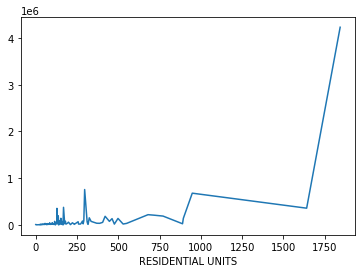

In [ ]:
dff['LAND SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean().plot()

In [18]:
dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).median()[:10]

RESIDENTIAL UNITS
0    8095.210613
1    1257.328867
2    2093.000000
3    2972.000000
4    3289.000000
5    4125.000000
6    4875.000000
7    5360.000000
8    6897.500000
9    7260.000000
Name: GROSS SQUARE FEET, dtype: float64

In [17]:
rtu= dff[dff['GROSS SQUARE FEET'].isna()].index
for i in range(len(dff['GROSS SQUARE FEET'])):
    if dff['GROSS SQUARE FEET'].index[i] in rtu:
        dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values
<ipython-input-17-582b3ac25ed4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docu

In [ ]:
# dff['GROSS SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== 0]['RESIDENTIAL UNITS'].values].values

array([4314.86296296])

In [ ]:
# dff.loc[dff.index== 0]['RESIDENTIAL UNITS'].values

array([5])

In [ ]:
dff['GROSS SQUARE FEET'].isna().sum()

5

## LAND SQUARE FEET

In [84]:
rtu= dff[dff['LAND SQUARE FEET'].isna()].index

In [ ]:
dff['LAND SQUARE FEET'].isna().sum()

26252

In [ ]:
rtu= dff[dff['LAND SQUARE FEET'].isna()].index
for i in range(len(dff['LAND SQUARE FEET'])):                             
    if dff['LAND SQUARE FEET'].index[i] in rtu:
        dff['LAND SQUARE FEET'][i] = dff['LAND SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values

In [ ]:
#dff['LAND SQUARE FEET'].groupby(dff['RESIDENTIAL UNITS']).mean()[dff.loc[dff.index== i]['RESIDENTIAL UNITS'].values].values

In [ ]:
dff['LAND SQUARE FEET'].isna().sum()

0

In [86]:
dff.isna().sum()

BOROUGH                               0
BUILDING CLASS CATEGORY               0
TAX CLASS AT PRESENT                  0
BLOCK                                 0
LOT                                   0
ZIP CODE                              0
RESIDENTIAL UNITS                     0
TOTAL UNITS                           0
LAND SQUARE FEET                      0
GROSS SQUARE FEET                     5
YEAR BUILT                            0
TAX CLASS AT TIME OF SALE             0
BUILDING CLASS AT TIME OF SALE        0
SALE PRICE                        13203
SALE DATE                             0
gbin                                  5
dtype: int64

In [87]:
dff['GROSS SQUARE FEET'].fillna(dff['GROSS SQUARE FEET'].median(), inplace=True)

## SALE PRICE

In [ ]:
dff.corr()['SALE PRICE']

BOROUGH                     -0.074418
BLOCK                       -0.061139
LOT                          0.012324
ZIP CODE                    -0.034170
RESIDENTIAL UNITS            0.119698
TOTAL UNITS                  0.125101
LAND SQUARE FEET             0.057212
GROSS SQUARE FEET            0.439407
YEAR BUILT                  -0.003539
TAX CLASS AT TIME OF SALE    0.091352
SALE PRICE                   1.000000
Name: SALE PRICE, dtype: float64

In [88]:
dff['gbin'] = pd.qcut(dff['GROSS SQUARE FEET'], 50, duplicates='drop')
dff['gbin']

0            (5000.0, 8095.210613206835]
1        (11893.419999999984, 3750565.0]
2            (5000.0, 8095.210613206835]
3            (5000.0, 8095.210613206835]
4                       (3920.0, 5000.0]
                      ...               
84543                   (2420.0, 2576.0]
84544                   (2304.0, 2420.0]
84545                   (1488.0, 1566.0]
84546    (11893.419999999984, 3750565.0]
84547                   (2304.0, 2420.0]
Name: gbin, Length: 84548, dtype: category
Categories (44, interval[float64]): [(-1e-12, 710.0] < (710.0, 990.0] < (990.0, 1108.0] <
                                     (1108.0, 1187.400000000002] < ... <
                                     (8095.210613208461, 8095.210613209416] < (8095.210613209416, 8095.210613210235] <
                                     (8095.210613210235, 11893.419999999984] < (11893.419999999984, 3750565.0]]

In [ ]:
dff.head()

,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,ZIP CODE,RESIDENTIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE,gbin
0,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,392,6,10009,5,5,1633.0,6440.0,1900,2,C2,6625000.0,2017-07-19 00:00:00,"(5000.0, 8095.210613206835]"
1,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,26,10009,28,31,4616.0,18690.0,1900,2,C7,NaN,2016-12-14 00:00:00,"(11894.120000000024, 3750565.0]"
2,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,39,10009,16,17,2212.0,7803.0,1900,2,C7,NaN,2016-12-09 00:00:00,"(5000.0, 8095.210613206835]"
3,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2B,402,21,10009,10,10,2272.0,6794.0,1913,2,C4,3936272.0,2016-09-23 00:00:00,"(5000.0, 8095.210613206835]"
4,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,404,55,10009,6,6,2369.0,4615.0,1900,2,C2,8000000.0,2016-11-17 00:00:00,"(3920.080000000002, 5000.0]"


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


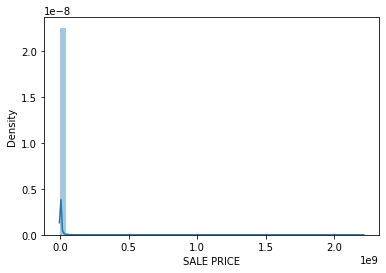

In [ ]:
sns.distplot(dff['SALE PRICE'])
plt.show()

In [90]:
rtu= dff[dff['SALE PRICE'].isna()].index

In [91]:
rtu= dff[dff['SALE PRICE'].isna()].index
for i in range(len(dff['SALE PRICE'])):
    if dff['SALE PRICE'].index[i] in rtu:
        dff['SALE PRICE'][i] = dff['SALE PRICE'].groupby(dff['gbin']).mean()[dff.loc[dff.index== i]['gbin'].values].values

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: h

In [ ]:
dff.loc[dff.index== 1]['gbin'].values

[(10317.700845114927, 3750565.0]]
Categories (44, interval[float64]): [(-1e-12, 890.888681047461] < (890.888681047461, 890.888681047502] <
                                     (890.888681047502, 890.888681047517] < (890.888681047517, 890.888681047526] < ... <
                                     (8451.277947142004, 8451.277947142084] < (8451.277947142084, 8451.277947142145] <
                                     (8451.277947142145, 10317.700845114927] < (10317.700845114927, 3750565.0]]

In [92]:
dff.isna().sum()

BOROUGH                           0
BUILDING CLASS CATEGORY           0
TAX CLASS AT PRESENT              0
BLOCK                             0
LOT                               0
ZIP CODE                          0
RESIDENTIAL UNITS                 0
TOTAL UNITS                       0
LAND SQUARE FEET                  0
GROSS SQUARE FEET                 0
YEAR BUILT                        0
TAX CLASS AT TIME OF SALE         0
BUILDING CLASS AT TIME OF SALE    0
SALE PRICE                        0
SALE DATE                         0
gbin                              0
dtype: int64

In [ ]:
dff.shape

(84548, 16)

In [ ]:
dfr= dff.copy()
dfr.shape

(84548, 16)

In [ ]:
dfr.drop_duplicates([''])

In [ ]:
df1[df1.duplicated() == True]

,Unnamed: 0,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,EASE-MENT,BUILDING CLASS AT PRESENT,ADDRESS,APARTMENT NUMBER,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE


In [ ]:
dff.head()

In [ ]:
dff.dtypes

BOROUGH                              int64
TAX CLASS AT PRESENT                object
BLOCK                                int64
LOT                                  int64
ZIP CODE                             int64
RESIDENTIAL UNITS                    int64
TOTAL UNITS                          int64
LAND SQUARE FEET                   float64
GROSS SQUARE FEET                  float64
YEAR BUILT                           int64
TAX CLASS AT TIME OF SALE            int64
BUILDING CLASS AT TIME OF SALE      object
SALE PRICE                         float64
SALE DATE                           object
BCC                                 object
gbin                              category
dtype: object

In [81]:
dtr= dff.loc[dff['SALE PRICE']==0].index

In [ ]:
dff.loc[dff['SALE PRICE']==0]

In [82]:
for i in range(len(dff['SALE PRICE'])):
  if dff['SALE PRICE'].index[i] in dtr:
    dff['SALE PRICE'][i] = dff['SALE PRICE'].groupby(dff['gbin']).mean()[dff.loc[dff.index== i]['gbin'].values].values

In [83]:
dff.isna().sum()

BOROUGH                               0
BUILDING CLASS CATEGORY               0
TAX CLASS AT PRESENT                  0
BLOCK                                 0
LOT                                   0
ZIP CODE                              0
RESIDENTIAL UNITS                     0
TOTAL UNITS                           0
LAND SQUARE FEET                  26252
GROSS SQUARE FEET                     5
YEAR BUILT                            0
TAX CLASS AT TIME OF SALE             0
BUILDING CLASS AT TIME OF SALE        0
SALE PRICE                        13203
SALE DATE                             0
gbin                                  5
dtype: int64

In [ ]:
dff.shape

(84548, 16)

In [ ]:
dff.head()

,BOROUGH,TAX CLASS AT PRESENT,BLOCK,LOT,ZIP CODE,RESIDENTIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE,BCC,gbin
0,1,2A,392,6,10009,5,5,2652.234432,4314.862963,1900,2,C2,6.625000e+06,2017-07-19 00:00:00,RENTALS - WALKUP APARTMENTS,"(3681.551756136368, 6000.0]"
1,1,2,399,26,10009,28,31,5940.185185,18690.000000,1900,2,C7,1.623150e+07,2016-12-14 00:00:00,RENTALS - WALKUP APARTMENTS,"(10317.700845114927, 3750565.0]"
2,1,2,399,39,10009,16,17,3934.877049,12142.122951,1900,2,C7,1.623150e+07,2016-12-09 00:00:00,RENTALS - WALKUP APARTMENTS,"(10317.700845114927, 3750565.0]"
3,1,2B,402,21,10009,10,10,2990.744828,8224.006897,1913,2,C4,3.936272e+06,2016-09-23 00:00:00,RENTALS - WALKUP APARTMENTS,"(6000.0, 8273.473069615084]"
4,1,2A,404,55,10009,6,6,2671.848793,5003.710828,1900,2,C2,8.000000e+06,2016-11-17 00:00:00,RENTALS - WALKUP APARTMENTS,"(3681.551756136368, 6000.0]"


In [ ]:
dff.corr()['YEAR BUILT']

BOROUGH                      0.108303
BLOCK                        0.071262
LOT                         -0.289463
ZIP CODE                     0.330708
RESIDENTIAL UNITS            0.025380
TOTAL UNITS                  0.024568
LAND SQUARE FEET            -0.021124
GROSS SQUARE FEET            0.017763
YEAR BUILT                   1.000000
TAX CLASS AT TIME OF SALE   -0.187609
SALE PRICE                  -0.003687
Name: YEAR BUILT, dtype: float64

In [ ]:
pd.crosstab(dff['NEIGHBORHOOD'], dff['ZIP CODE'])[20:]

ZIP CODE,0,10001,10002,10003,10004,10005,10006,10007,10009,10010,10011,10012,10013,10014,10016,10017,10018,10019,10021,10022,10023,10024,10025,10026,10027,10028,10029,10030,10031,10032,10033,10034,10035,10036,10037,10038,10039,10040,10044,10065,...,11366,11367,11368,11369,11370,11372,11373,11374,11375,11377,11378,11379,11385,11411,11412,11413,11414,11415,11416,11417,11418,11419,11420,11421,11422,11423,11426,11427,11428,11429,11430,11432,11433,11434,11435,11436,11691,11692,11693,11694
NEIGHBORHOOD,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
BERGEN BEACH,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
BLOOMFIELD,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
BOERUM HILL,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
BOROUGH PARK,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
BRIARWOOD,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,205,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WOODHAVEN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,30,0,0,383,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
WOODLAWN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
WOODROW,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
dff['ZIP CODE'].replace({0:np.nan}, inplace=True)

In [ ]:
dff['ZIP CODE'].fillna(method='ffill', inplace=True)

In [ ]:
dff.isna().sum()

BOROUGH                               0
NEIGHBORHOOD                          0
BUILDING CLASS CATEGORY               0
TAX CLASS AT PRESENT                  0
BLOCK                                 0
LOT                                   0
ZIP CODE                              0
RESIDENTIAL UNITS                     0
TOTAL UNITS                           0
LAND SQUARE FEET                  26252
GROSS SQUARE FEET                     5
YEAR BUILT                            0
TAX CLASS AT TIME OF SALE             0
BUILDING CLASS AT TIME OF SALE        0
SALE PRICE                        13203
SALE DATE                             0
gbin                                  5
dtype: int64

In [ ]:
dff['YEAR BUILT'].groupby(dff['ZIP CODE']).count()

ZIP CODE
10001.0    207
10002.0    328
10003.0    812
10004.0     95
10005.0    199
          ... 
11436.0    317
11691.0    455
11692.0    159
11693.0    144
11694.0    275
Name: YEAR BUILT, Length: 185, dtype: int64

## Year built - 0 treatment

In [ ]:
dtr = dff[dff['YEAR BUILT']==0].index

for i in range(len(dff['YEAR BUILT'])):
  if dff['YEAR BUILT'].index[i] in dtr:
    dff['YEAR BUILT'][i] = dff['YEAR BUILT'].groupby(dff['ZIP CODE']).mean()[dff.loc[dff.index== i]['ZIP CODE'].values].values

In [ ]:
dff[dff['YEAR BUILT']==0]

,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,ZIP CODE,RESIDENTIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE,gbin


In [ ]:
dff.head()

,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,ZIP CODE,RESIDENTIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE,gbin
0,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,392,6,10009.0,5,5,1633.0,6440.0,1900,2,C2,6.625000e+06,2017-07-19 00:00:00,"(5000.0, 8095.210613206835]"
1,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,26,10009.0,28,31,4616.0,18690.0,1900,2,C7,1.680109e+07,2016-12-14 00:00:00,"(11894.120000000024, 3750565.0]"
2,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,39,10009.0,16,17,2212.0,7803.0,1900,2,C7,2.245890e+06,2016-12-09 00:00:00,"(5000.0, 8095.210613206835]"
3,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2B,402,21,10009.0,10,10,2272.0,6794.0,1913,2,C4,3.936272e+06,2016-09-23 00:00:00,"(5000.0, 8095.210613206835]"
4,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,404,55,10009.0,6,6,2369.0,4615.0,1900,2,C2,8.000000e+06,2016-11-17 00:00:00,"(3920.080000000002, 5000.0]"


In [ ]:
# Drop TAX CLASS AT TIME OF SALE and int-fy the TAX CLASS AT PRESENT. 

In [103]:
for i in dff.select_dtypes(include='number'):
  if 0 in dff[i].values:
    print(i)

RESIDENTIAL UNITS
TOTAL UNITS
GROSS SQUARE FEET


In [ ]:
dff[dff['TOTAL UNITS']==0]

In [ ]:
dff.corr()['TOTAL UNITS']

BOROUGH                     -0.023346
BLOCK                       -0.015888
LOT                         -0.033169
ZIP CODE                    -0.013172
RESIDENTIAL UNITS            0.888309
TOTAL UNITS                  1.000000
LAND SQUARE FEET             0.368495
GROSS SQUARE FEET            0.638606
YEAR BUILT                   0.008603
TAX CLASS AT TIME OF SALE    0.026429
SALE PRICE                   0.126943
Name: TOTAL UNITS, dtype: float64

In [ ]:
dtr = dff[dff['TOTAL UNITS']==0].index

for i in range(len(dff['TOTAL UNITS'])):
  if dff['TOTAL UNITS'].index[i] in dtr:
    dff['TOTAL UNITS'][i] = dff['TOTAL UNITS'].groupby(dff['gbin']).mean()[dff.loc[dff.index== i]['gbin'].values].values

In [72]:
dff['TOTAL UNITS'].groupby(dff['gbin']).mean()[dff.loc[dff.index== 0]['gbin'].values].values

array([5.39795304])

In [ ]:
# Sanity check on ffill.

'''u=[]
j=0
for i in list(df1['ZIP CODE']):
    if i==0:
        u.append(j)
    j+=1
for i in u:
    if df1.loc[i]['NEIGHBORHOOD']==df1.loc[i-1]['NEIGHBORHOOD']:
        df1['ZIP CODE'][i]=df1['ZIP CODE'][i-1]
    else:
        if df1.loc[i]['NEIGHBORHOOD']==df1.loc[i+1]['NEIGHBORHOOD']:
            df1['ZIP CODE'][i]=df1['ZIP CODE'][i+1]'''


In [ ]:
dff[dff['TOTAL UNITS']==0]

In [80]:
dff.isna().sum()

BOROUGH                               0
BUILDING CLASS CATEGORY               0
TAX CLASS AT PRESENT                  0
BLOCK                                 0
LOT                                   0
ZIP CODE                              0
RESIDENTIAL UNITS                     0
TOTAL UNITS                           0
LAND SQUARE FEET                  26252
GROSS SQUARE FEET                     5
YEAR BUILT                            0
TAX CLASS AT TIME OF SALE             0
BUILDING CLASS AT TIME OF SALE        0
SALE PRICE                        13203
SALE DATE                             0
gbin                                  5
dtype: int64

In [102]:
# RESIDENTIAL UNITS TOTAL UNITS LAND SQUARE FEET GROSS SQUARE FEET

dff[dff['LAND SQUARE FEET']==0]

,BOROUGH,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,ZIP CODE,RESIDENTIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE,gbin


In [ ]:
dtr = dff[dff['LAND SQUARE FEET']==0].index

for i in range(len(dff['LAND SQUARE FEET'])):
  if dff['LAND SQUARE FEET'].index[i] in dtr:
    dff['LAND SQUARE FEET'][i] = dff['LAND SQUARE FEET'].groupby(dff['gbin']).mean()[dff.loc[dff.index== i]['gbin'].values].values

In [ ]:
dtr = dff[dff['GROSS SQUARE FEET']==0].index

for i in range(len(dff['GROSS SQUARE FEET'])):
  if dff['GROSS SQUARE FEET'].index[i] in dtr:
    dff['GROSS SQUARE FEET'][i] = dff['GROSS SQUARE FEET'].groupby(dff['gbin']).mean()[dff.loc[dff.index== i]['gbin'].values].values

In [120]:
for i in dff.select_dtypes(include='number'):
  if 0 in dff[i].values:
    print(i)

### RESIDENTIAL UNITS is also dependednt on Gross sqaure feet

In [ ]:
dtr = dff[dff['RESIDENTIAL UNITS']==0].index

for i in range(len(dff['RESIDENTIAL UNITS'])):
  if dff['RESIDENTIAL UNITS'].index[i] in dtr:
    dff['RESIDENTIAL UNITS'][i] = dff['RESIDENTIAL UNITS'].groupby(dff['gbin']).mean()[dff.loc[dff.index== i]['gbin'].values].values

In [ ]:
for i in range(len(dff['RESIDENTIAL UNITS'])):
  if dff['RESIDENTIAL UNITS'][i] == 0:
    dff['RESIDENTIAL UNITS'][i] = dff['RESIDENTIAL UNITS'].groupby(dff['gbin']).mean()[dff.loc[dff.index== 0]['gbin'].values].values

In [119]:
# TOTAL UNITS

for i in range(len(dff['TOTAL UNITS'])):
  if dff['TOTAL UNITS'][i] == 0:
    dff['TOTAL UNITS'][i] = dff['RESIDENTIAL UNITS'][i]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


In [122]:
dff.to_csv('cleaned_ny_property.csv')

# EDA

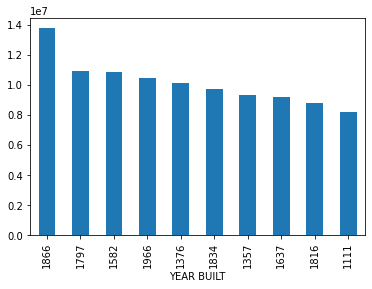

In [127]:
# sales change over the years

dff['SALE PRICE'].groupby(dff['YEAR BUILT']).mean().sort_values(ascending=False)[:10].plot(kind='bar')

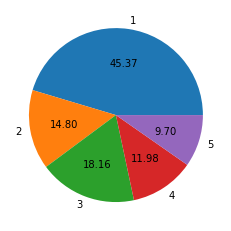

In [129]:
# Sales varying with borough wise

lab= [1,2,3,4,5]
plt.pie(dff['SALE PRICE'].groupby(dff['BOROUGH']).mean(), autopct='%.2f', labels=lab)
plt.show()

In [152]:
dff.head()[:1]

,BOROUGH,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,ZIP CODE,RESIDENTIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE,gbin
0,1,07 RENTALS - WALKUP APARTMENTS,2A,392,6,10009.0,5,5,1633.0,6440.0,1900,2,C2,6625000.0,2017-07-19,"(5000.0, 8095.210613206835]"


In [149]:
# most lived zip codes

dff['SALE PRICE'].groupby(dff['ZIP CODE']).mean().sort_values(ascending=False).index[:5]

Float64Index([10167.0, 10281.0, 10001.0, 10004.0, 10005.0], dtype='float64', name='ZIP CODE')

In [151]:
dff['SALE DATE'] = pd.to_datetime(dff['SALE DATE'], errors='coerce')

In [164]:
dff['SALE PRICE'].groupby(dff['SALE DATE']).mean().sort_values(ascending=False)[:10]

SALE DATE
2017-05-05    8.254076e+06
2016-11-20    5.855534e+06
2017-01-24    4.372340e+06
2017-04-29    3.990543e+06
2017-05-24    3.742778e+06
2016-11-01    3.546149e+06
2016-12-08    3.454322e+06
2017-01-22    3.174035e+06
2016-12-31    3.106082e+06
2016-12-20    2.844660e+06
Name: SALE PRICE, dtype: float64

In [165]:
# 2017 year had the highest prices of real estate. 

-0.3250051722023964
-1.0299198688630413


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


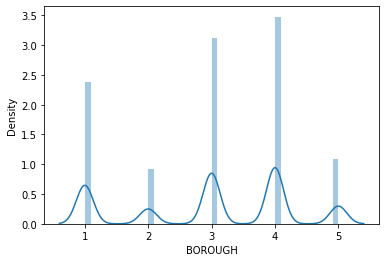

1.049335038751652
0.5968940340734243


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


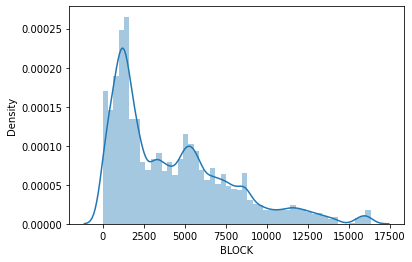

3.500679348945269
24.937658009118152


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


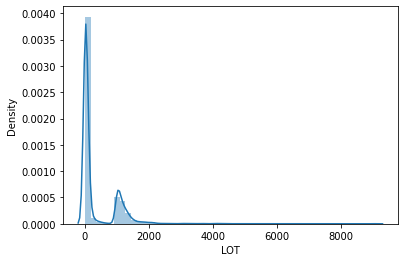

-0.45820341847470275
-1.537908225884436


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


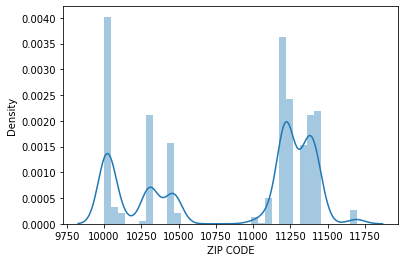

55.875809524975345
4739.288264023568


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


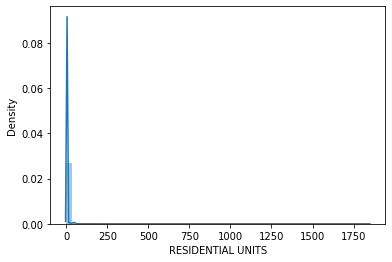

63.35339601872284
5714.090596176725


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


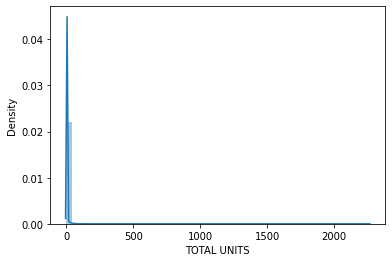

88.1100673815519
9292.353411173017


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


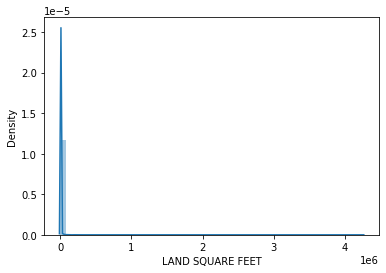

72.09077851770334
7739.032056250984


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


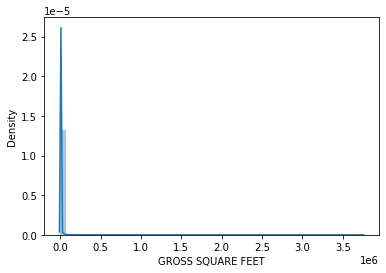

-5.742362788997288
50.92025191629771


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


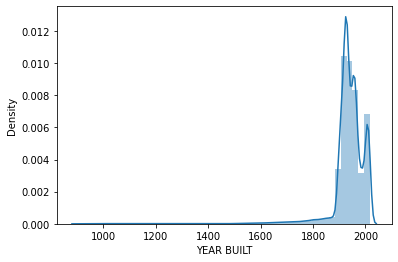

1.51538048197502
2.184374824940168


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


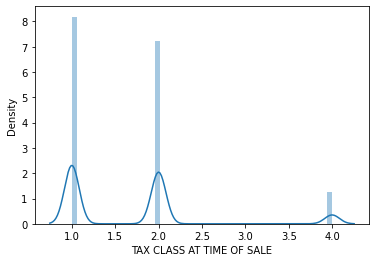

131.37741255619946
24694.69603172593


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


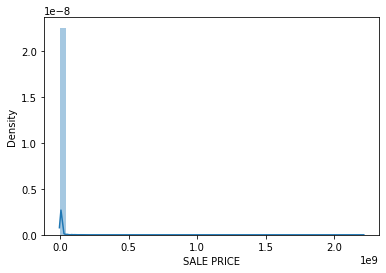

In [166]:
# checking skewness:

for i in dff.select_dtypes(include='number'):
  print(dff[i].skew())
  print(dff[i].kurt())
  sns.distplot(dff[i])
  plt.show()

In [167]:
for i in dff.select_dtypes(include='number'):
  print(i, dff[i].skew())
  print(i, dff[i].kurt())
  print('\n')

BOROUGH -0.3250051722023964
BOROUGH -1.0299198688630413


BLOCK 1.049335038751652
BLOCK 0.5968940340734243


LOT 3.500679348945269
LOT 24.937658009118152


ZIP CODE -0.45820341847470275
ZIP CODE -1.537908225884436


RESIDENTIAL UNITS 55.875809524975345
RESIDENTIAL UNITS 4739.288264023568


TOTAL UNITS 63.35339601872284
TOTAL UNITS 5714.090596176725


LAND SQUARE FEET 88.1100673815519
LAND SQUARE FEET 9292.353411173017


GROSS SQUARE FEET 72.09077851770334
GROSS SQUARE FEET 7739.032056250984


YEAR BUILT -5.742362788997288
YEAR BUILT 50.92025191629771


TAX CLASS AT TIME OF SALE 1.51538048197502
TAX CLASS AT TIME OF SALE 2.184374824940168


SALE PRICE 131.37741255619946
SALE PRICE 24694.69603172593




In [169]:
# We need to log transform the data coz of high skewness. 

# before that we gotta dummy encode the categorical ones. 

dff.columns

Index(['BOROUGH', 'BUILDING CLASS CATEGORY', 'TAX CLASS AT PRESENT', 'BLOCK',
       'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 'TOTAL UNITS',
       'LAND SQUARE FEET', 'GROSS SQUARE FEET', 'YEAR BUILT',
       'TAX CLASS AT TIME OF SALE', 'BUILDING CLASS AT TIME OF SALE',
       'SALE PRICE', 'SALE DATE', 'gbin'],
      dtype='object')

In [170]:
dff['TAX CLASS AT TIME OF SALE'].unique()

array([2, 4, 1, 3])

In [173]:
dff.head()[:1]

,BOROUGH,BUILDING CLASS CATEGORY,BLOCK,LOT,ZIP CODE,RESIDENTIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE
0,1,07 RENTALS - WALKUP APARTMENTS,392,6,10009.0,5,5,1633.0,6440.0,1900,2,C2,6625000.0


In [172]:
dff.drop({'TAX CLASS AT PRESENT'}, axis=1, inplace=True)
dff.drop({'gbin'}, axis=1, inplace=True)
dff.drop({'SALE DATE'}, axis=1, inplace=True)

In [174]:
dff.to_csv('Clean_NY_property.csv')